Dataset is from: https://www.kaggle.com/code/gpiosenka/time-classification-with-video/data

This project reads the images from the dataset to predict the time. VGG16 was used for the Machine Learning portion to learn the time and to predict.

# Check for GPU

In [1]:
import tensorflow as tf
from tensorflow.python.client import device_lib
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Import Libraries

In [2]:
import pandas as pd
import numpy as np

import os
import time
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import cv2
import seaborn as sns
import shutil

from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax, SGD
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K

from livelossplot import inputs
from livelossplot.inputs import PlotLossesKeras

import time
from tqdm import tqdm

import sys
if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

from pathlib import Path

In [3]:
overall_dir = "C:/Users/hl/Desktop/ACV2/clock-dataset"
train_dir = "C:/Users/hl/Desktop/ACV2/clock-dataset/train"
test_dir = "C:/Users/hl/Desktop/ACV2/clock-dataset/test"
valid_dir = "C:/Users/hl/Desktop/ACV2/clock-dataset/valid"

In [4]:
time_list = sorted(os.listdir(train_dir))

In [5]:
train_files_count_arr = list()
test_files_count_arr = list()
valid_files_count_arr = list()

for clock_time in enumerate(time_list):
    train_files_path = os.path.join(train_dir, clock_time[1])
    train_files_list = os.listdir(train_files_path)
    train_files_count = str(len(train_files_list))
    test_files_path = os.path.join(test_dir, clock_time[1])
    test_files_list = os.listdir(test_files_path)
    test_files_count = str(len(test_files_list))
    valid_files_path = os.path.join(valid_dir, clock_time[1])
    valid_files_list = os.listdir(valid_files_path)
    valid_files_count = str(len(valid_files_list))

    train_files_count_arr.append(train_files_count)
    test_files_count_arr.append(test_files_count)
    valid_files_count_arr.append(valid_files_count)

In [6]:
data = {
    "class_id": [i for i in range(len(time_list))],
    "clock_time": time_list,
    "train": train_files_count_arr,
    "test": test_files_count_arr,
    "valid": valid_files_count_arr
}

df = pd.DataFrame(data)

df.head()

,class_id,clock_time,train,test,valid
0,0,1-00,80,10,10
1,1,1-05,80,10,10
2,2,1-10,80,10,10
3,3,1-15,80,10,10
4,4,1-20,80,10,10


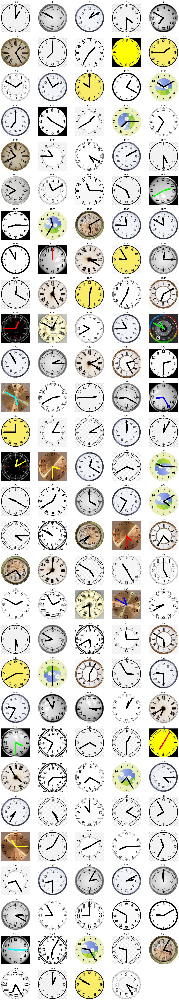

In [7]:
classes = len(df["class_id"])

if classes % 5 == 0:
    rows = int(classes/5)

else:
    rows = int(classes/5) + 1

size = int(classes/5) * 4
fig = plt.figure(figsize=(20, size))

for row in range(rows):
    for column in range(5):
        i = row * 5 + column

        if i > classes - 1:
            break

        time = df["clock_time"][i]
        #time = clock_time[i]
        time_path = os.path.join(test_dir, time)
        flist = os.listdir(time_path)
        f_path = os.path.join(time_path, flist[0])
        img = mpimg.imread(f_path)
        plt.subplot(rows, 5, i+1)
        plt.axis("off")
        plt.title(time)
        plt.imshow(img)

plt.show()

In [8]:
def make_dataframes(train_dir, test_dir, val_dir):
    dirlist = [train_dir, test_dir, val_dir]
    names = ['train', 'test', 'valid']
    zipdir = zip(names, dirlist)

    for name, dir in zipdir:
        filepaths = []
        labels = []
        time_list = sorted(os.listdir(dir))

        for clock_time in time_list:
            class_path = os.path.join(dir, clock_time)
            files_list = sorted(os.listdir(class_path))

            desc = f'{name:6s} - {clock_time:25s}'

            for clock_file in tqdm(files_list, ncols=130, desc=desc, unit='files', colour='ff5733'):
                file_path = os.path.join(class_path, clock_file)
                filepaths.append(file_path)
                labels.append(clock_time)

        File_series = pd.Series(filepaths, name='filepaths')
        Label_series = pd.Series(labels, name='labels')
        df = pd.concat([File_series, Label_series], axis=1)

        if name == 'valid':
            valid_df = df
        elif name == 'test':
            test_df = df
        else:
            train_df = df

    classes = sorted(train_df['labels'].unique())
    class_count = len(classes)
    sample_df = train_df.sample(n=50, replace=False)

    height = 0
    width = 0
    count = 0

    for i in range(len(sample_df)):
        file_path = sample_df['filepaths'].iloc[i]
        try:
            img = cv2.imread(file_path)
            h = img.shape[0]
            w = img.shape[1]
            height += h
            width += w
            count += 1
        except:
            pass

    average_h = int(height/count)
    average_w = int(width/count)
    aspect_ratio = average_h/average_w
    print('number of classes in processed dataset = ', class_count)
    counts = list(train_df['labels'].value_counts())
    print('the maximum files in any class in train_df is ', max(counts))
    print('the minimum files in any class in train_df is ', min(counts)) 
    print('train_df length: ', len(train_df))
    print('test_df length: ', len(test_df)) 
    print('valid_df length: ', len(valid_df))
    print('average image height = ', average_h)
    print('average image width = ', average_w)
    print('aspect ratio h/w = ', aspect_ratio)

    return train_df, test_df, valid_df, classes, class_count


In [9]:
train_df, test_df, valid_df, classes, class_count = make_dataframes(train_dir, test_dir, valid_dir)

train  - 8-15                     : 100%|███████████████████████████████████████████████████| 80/80 [00:00<00:00, 79929.57files/s]


test   - 6-35                     : 100%|██████████████████████████████████████████████████████████████| 10/10 [00:00<?, ?files/s]


valid  - 4-55                     : 100%|████████████████████████████████████████████████████| 10/10 [00:00<00:00, 9998.34files/s]


valid  - 9-55                     : 100%|██████████████████████████████████████████████████████████████| 10/10 [00:00<?, ?files/s]


number of classes in processed dataset =  144
the maximum files in any class in train_df is  80
the minimum files in any class in train_df is  80
train_df length:  11520
test_df length:  1440
valid_df length:  1440
average image height =  224
average image width =  224
aspect ratio h/w =  1.0


In [10]:
def make_gens(batch_size, train_df, test_df, valid_df, img_size):
    train_gen = ImageDataGenerator(horizontal_flip=True)
    test_and_valid_gen = ImageDataGenerator()
    msg = '{0:70s} for train generator'.format(' ')
    print(msg, '\r', end='')

    train_generator = train_gen.flow_from_dataframe(train_df, 
                                                    x_col='filepaths', y_col='labels', 
                                                    target_size=img_size,
                                                    class_mode='categorical', color_mode='rgb',
                                                    shuffle=True, 
                                                    batch_size=batch_size)
    
    msg = '{0:70s} for valid generator'.format(' ')
    print(msg, '\r', end='')
    valid_generator = test_and_valid_gen.flow_from_dataframe(valid_df, 
                                                x_col='filepaths', y_col='labels', 
                                                target_size=img_size,
                                                class_mode='categorical', color_mode='rgb',
                                                shuffle=False, 
                                                batch_size=batch_size)
    
    # For test_gen, want to calculate the batch size & test steps such that 
    # batch_size X test_steps = number of samples in test set
    # this ensures that all the sample in the test set go through exactly once

    length = len(test_df)
    test_batch_size = sorted([int(length/n) for n in range(1, length+1) if length%n == 0 and length/n <= 80], reverse=True)[0]
    test_steps = int(length/test_batch_size)

    msg = '{0:70s} for test generator'.format(' ')
    print(msg, '\r', end='')
    test_generator = test_and_valid_gen.flow_from_dataframe(test_df, 
                                                x_col='filepaths', y_col='labels', 
                                                target_size=img_size,
                                                class_mode='categorical', color_mode='rgb',
                                                shuffle=False, 
                                                batch_size=test_batch_size)
    
    print('test batch size: ', test_batch_size)
    print('test steps: ', test_steps)
    print('number of classes: ', class_count)

    return train_generator, test_generator, valid_generator, test_batch_size, test_steps, classes

In [11]:
#img_size=(150,150)
img_size=(224, 224)

In [12]:
batch_size = 30
train_gen, test_gen, valid_gen, test_batch_size, test_steps, classes = make_gens(batch_size, train_df, test_df, valid_df, img_size)

Found 11520 validated image filenames belonging to 144 classes.        for train generator 
Found 1440 validated image filenames belonging to 144 classes.         for valid generator 
Found 1440 validated image filenames belonging to 144 classes.         for test generator 
test batch size:  80
test steps:  18
number of classes:  144


In [13]:
def show_image_samples(gen):
    train_dict = gen.class_indices
    classes = list(train_dict.keys())
    images, labels = next(gen)
    plt.figure(figsize=(25,25))
    length=len(labels)
    if length < 25:
        r = length
    else:
        r = 25

    for i in range(r):
        plt.subplot(5, 5, i+1)
        image = images[i] / 255
        plt.imshow(image)
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, color='blue', fontsize=18)
        plt.axis('off')

    plt.show()

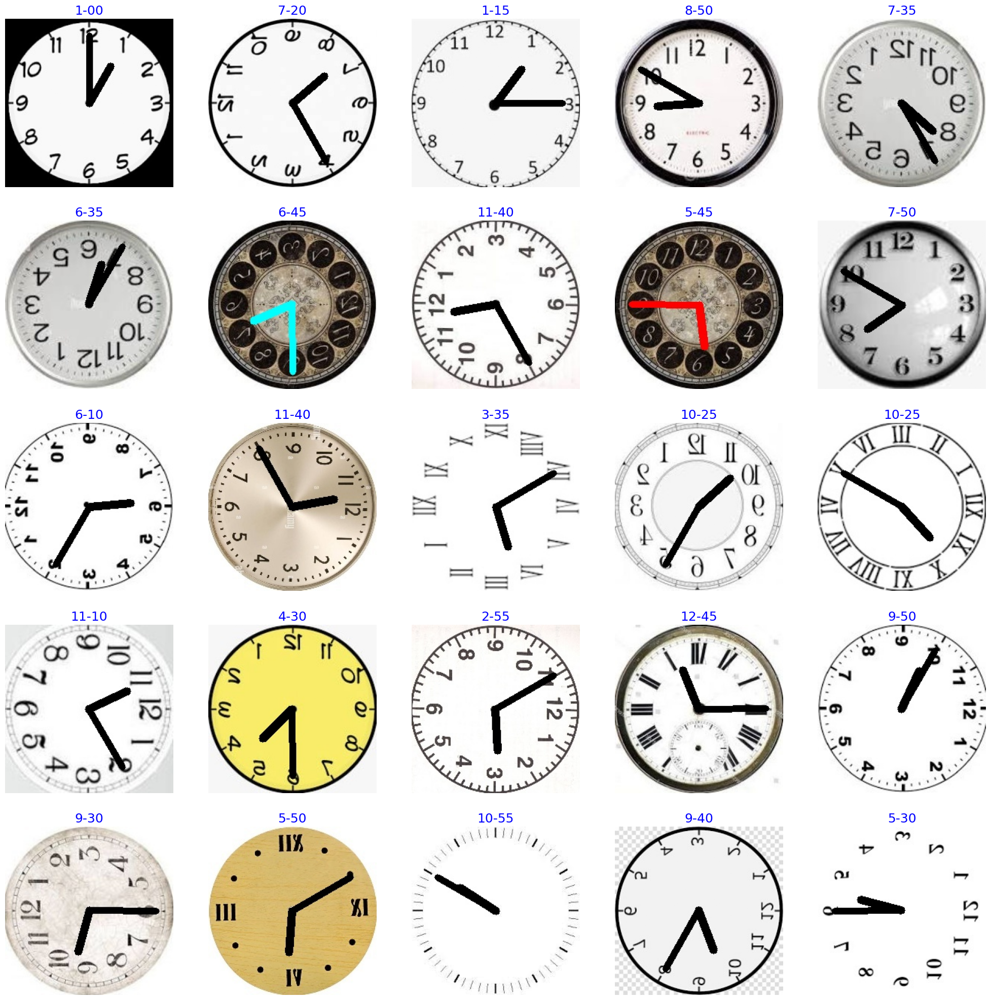

In [14]:
show_image_samples(train_gen)

In [15]:
def create_model (input_shape, n_classes, optimizer='rmsprop', fine_tune=0):
    
    # Pretrained convolutional layers are loaded using the Imagenet weights.
    # Include_top set to False, to exclude model's fully-connected layers

    conv_base = VGG16(include_top=False,
                      weights='imagenet',
                      input_shape = input_shape)
    
    # Defines how many layers to freeze during training
    # Layers in convolutional base are switched from trainable to non-trainable
    # depending on size of fine-tuning parameter
    
    if fine_tune > 0:
        for layer in conv_base.layers[:-fine_tune]:
            layer.trainable = False
    else:
        for layer in conv_base.layers:
            layer.trainable = False

    # Create new 'top' of model (ie fully connected layers)
    # This is 'bootstrapping' a new top_model onto the pretrained layers.

    top_model = conv_base.output
    top_model = Flatten(name='flatten')(top_model)
    top_model = Dense(4096, activation='relu')(top_model)
    top_model = Dense(1072, activation='relu')(top_model)
    top_model = Dropout(0.2)(top_model)
    output_layer = Dense(n_classes, activation='softmax')(top_model)

    # Group the convolutional base and new fully-connected layers into Model object
    model = Model(inputs=conv_base.input, outputs=output_layer)

    # Compiles model for training
    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

In [22]:
input_shape = (224, 224, 3)
#input_shape = (150, 150, 3)
optim_1 = Adam(learning_rate=0.0001)
#optim_1 = SGD(learning_rate=0.01)
n_classes = len(classes)

n_steps = train_gen.samples // batch_size
n_val_steps = valid_gen.samples // batch_size
n_epochs = 200

# Training the model wtihout Fine-tuning
vgg_model = create_model(input_shape, n_classes, optim_1, fine_tune=0)

In [23]:
plot_loss_3 = PlotLossesKeras()

# ModelCheckpoint callback - save best weights
tl_checkpoint_3 = ModelCheckpoint(filepath= 'tl_model_v3.weights.best.hdf5',
                                  save_best_only=True,
                                  verbose=1)

# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',
                           patience=10,
                           restore_best_weights=True,
                           mode='min')

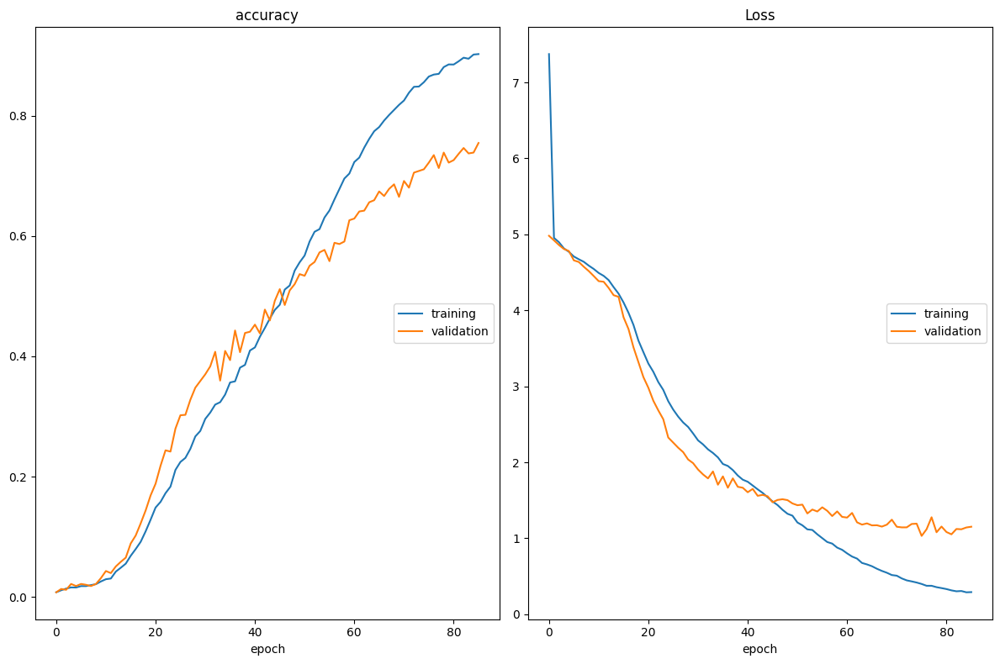

accuracy
	training         	 (min:    0.008, max:    0.903, cur:    0.903)
	validation       	 (min:    0.008, max:    0.755, cur:    0.755)
Loss
	training         	 (min:    0.288, max:    7.374, cur:    0.291)
	validation       	 (min:    1.031, max:    4.982, cur:    1.152)
384/384 [==============================] - 56s 147ms/step - loss: 0.2909 - accuracy: 0.9027 - val_loss: 1.1518 - val_accuracy: 0.7549
CPU times: total: 2h 51min 44s
Wall time: 3h 14min 38s


In [24]:
%%time

vgg_history = vgg_model.fit(train_gen,
                            batch_size=batch_size,
                            epochs=n_epochs,
                            validation_data=valid_gen,
                            steps_per_epoch=n_steps,
                            validation_steps=n_val_steps,
                            callbacks=[tl_checkpoint_3, early_stop, plot_loss_3],
                            verbose=1)

# Prediction and Accuracy

In [27]:
# Initialise the best trained weights
vgg_model.load_weights('tl_model_v3.weights.best.hdf5')

true_classes = test_gen.classes
class_indices = train_gen.class_indices
class_indices = dict((v, k) for k, v in class_indices.items())

vgg_preds = vgg_model.predict(test_gen)
vgg_pred_classes = np.argmax(vgg_preds, axis=1)

18/18 [==============================] - 5s 315ms/step


In [28]:
from sklearn.metrics import accuracy_score

vgg_acc = accuracy_score(true_classes, vgg_pred_classes)
print("VGG16 Model Accuracy without Fine-Tuning: {:.2f}%".format(vgg_acc * 100))

VGG16 Model Accuracy without Fine-Tuning: 71.74%
